<a href="https://colab.research.google.com/github/gmauricio-toledo/NLP-MCD/blob/main/12-TopicModellingEmbeddings.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1>Topic Modelling pt II: Embeddings</h1>

En esta notebook exploraremos la tarea de **Topic Modelling* usando embeddings de distinta naturaleza y los compararemos con las técnicas clásicas: LDA y LSA.

# Definiciones de funciones

In [ ]:
import math

def get_umass_score(dt_matrix, i, j):
    zo_matrix = (dt_matrix > 0).astype(int)
    col_i, col_j = zo_matrix[:, i], zo_matrix[:, j]
    col_ij = col_i + col_j
    col_ij = (col_ij == 2).astype(int)
    Di, Dij = col_i.sum(), col_ij.sum()
    return math.log((Dij + 1) / Di)

def get_topic_coherence(dt_matrix, topic, n_top_words):
    indexed_topic = zip(topic, range(0, len(topic)))
    topic_top = sorted(indexed_topic, key=lambda x: 1 - x[0])[0:n_top_words]
    coherence = 0
    for j_index in range(0, len(topic_top)):
        for i_index in range(0, j_index - 1):
            i = topic_top[i_index][1]
            j = topic_top[j_index][1]
            coherence += get_umass_score(dt_matrix, i, j)
    return coherence

def get_average_topic_coherence(dt_matrix, topics, n_top_words):
    total_coherence = 0
    for i in range(0, len(topics)):
        total_coherence += get_topic_coherence(dt_matrix, topics[i], n_top_words)
    return total_coherence / len(topics)

In [ ]:
from sklearn.manifold import TSNE
import plotly.graph_objects as go
import plotly

def plot_3d(X,labels):
    plotly.offline.init_notebook_mode()
    trace = go.Scatter3d(
        x=X[:,0],
        y=X[:,1],
        z=X[:,2],
        mode='markers',
        marker={
            'size': 3,
            'opacity': 0.75,
            'color': labels,
            # 'colorscale': 'Viridis'
        },
        hovertemplate='%{text}',
        text = [doc[:50] for doc in docs]
    )
    layout = go.Layout(
        margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
    )
    data = [trace]
    plot_figure = go.Figure(data=data, layout=layout)
    plot_figure.update_layout(
        title = '20NG',
        scene = dict(
            xaxis = dict(visible=False),
            yaxis = dict(visible=False),
            zaxis =dict(visible=False)
            )
        )
    return plot_figure

In [37]:
import nltk
import pandas as pd
import numpy as np
from nltk import word_tokenize
import re
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import matplotlib.pyplot as plt
from string import punctuation

nltk.download('punkt')
nltk.download('stopwords')

stopwords = nltk.corpus.stopwords.words('spanish')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [38]:
!pip install -qq wordcloud

In [39]:
def normalizar_vector(v):
    if np.linalg.norm(v) == 0:
        return v
    else:
        return v / np.linalg.norm(v)

# El corpus: 20NewsGroups (3 tópicos)




In [40]:
stopwords = nltk.corpus.stopwords.words('english')

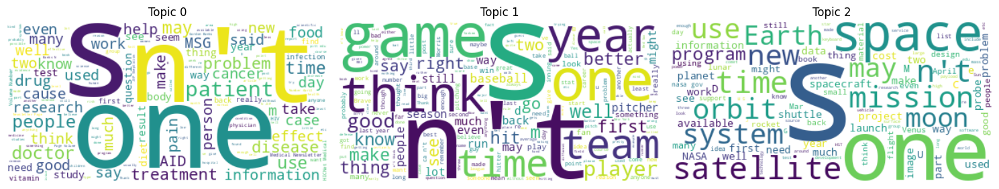

In [41]:
stopwords.extend(["n't","S","s"])

In [42]:
from sklearn.datasets import fetch_20newsgroups

train_data = fetch_20newsgroups(subset='train',
                                remove=('headers', 'footers', 'quotes'),
                                categories=['sci.space', 'rec.sport.baseball','sci.med'],
                                random_state=642
                                )
test_data = fetch_20newsgroups(subset='test',
                                remove=('headers', 'footers', 'quotes'),
                                categories=['sci.space', 'rec.sport.baseball','sci.med'],
                                random_state=642
                               )

X_train_raw = train_data.data
y_train = train_data.target

X_test_raw = test_data.data
y_test = test_data.target

In [83]:
X_raw = X_train_raw + X_test_raw
y = np.concatenate((y_train, y_test))

print(f"Número de documentos: {len(X_raw)}")

Número de documentos: 2971


In [44]:
X_raw = [re.sub(r'\d+', ' ', doc) for doc in X_raw]
tokenized_docs = [[x for x in word_tokenize(doc) if x not in stopwords and x not in punctuation]
                        for doc in X_raw]
docs = [' '.join(doc) for doc in tokenized_docs]

In [45]:
vectorizer = TfidfVectorizer(max_features=2000, stop_words=stopwords)
X_tfidf = vectorizer.fit_transform(docs).toarray()

In [46]:
vectorizer = CountVectorizer(max_features=2000, stop_words=stopwords)
X_bow = vectorizer.fit_transform(docs).toarray()

# Topic Modelling: LDA en la matriz BOW

Usemos la implementación de LDA de scikit-learn.

[Documentación](https://scikit-learn.org/1.5/modules/generated/sklearn.decomposition.LatentDirichletAllocation.html)

In [59]:
lda = LatentDirichletAllocation(n_components=3,random_state=0)
# lda.fit(X_tfidf)
lda.fit(X_bow)

LatentDirichletAllocation(n_components=3, random_state=0)

In [52]:
lda.transform(X_bow)[0]

array([0.00959149, 0.98060378, 0.00980472])

In [61]:
topics = np.argmax(lda.transform(X_bow), axis=1)

num_topics = len(np.unique(topics))
docs_idxs_per_topic = [np.where(topics == i)[0] for i in range(num_topics)]

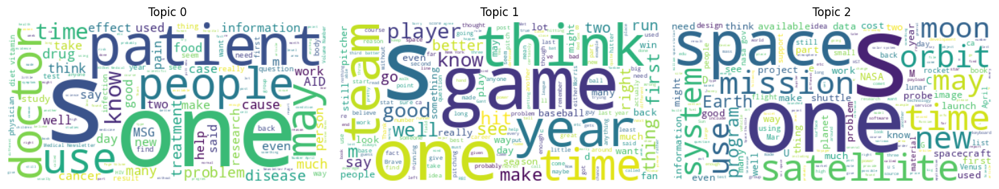

In [22]:
from wordcloud import WordCloud

fig, axs = plt.subplots(1, num_topics, figsize=(15, 15))
for ax,j in zip(axs.flatten(),range(num_topics)):
    topic_docs = " ".join([docs[i] for i in docs_idxs_per_topic[j]])
    wc = WordCloud(background_color="white", max_words=2000).generate(topic_docs)
    ax.imshow(wc, interpolation='bilinear')
    ax.set_title(f"Topic {j}")
    ax.axis("off")
fig.tight_layout()
fig.show()

In [29]:
lda.components_.shape

(3, 2000)

## Evaluación

Evaluemos usando la coherencia, cambiemos el número de palabras más frecuentes y observemos el efecto

In [15]:
get_average_topic_coherence(X_tfidf, lda.components_, 10)

-58.1296803560518

In [31]:
get_average_topic_coherence(X_tfidf, lda.components_, 20)

-292.048182739361

¿Cómo cambia la coherencia si cambiamos el parámetro anterior?

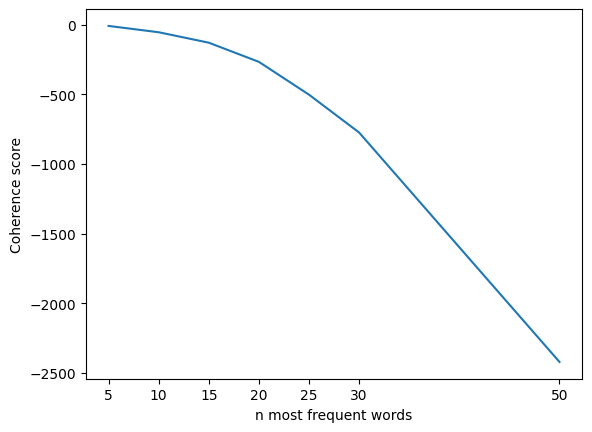

In [34]:
coherences = []

lda = LatentDirichletAllocation(n_components=3,random_state=0)
lda.fit(X_tfidf)

ns = [5,10,15,20,25,30,50]

for n in ns:
    coh = get_average_topic_coherence(X_tfidf, lda.components_, n)
    coherences.append(coh)

plt.figure()
plt.plot(ns, coherences)
plt.xlabel("n most frequent words")
plt.ylabel("Coherence score")
plt.xticks(ns)
plt.show()

¿Cómo cambia la coherencia con el número de tópicos?

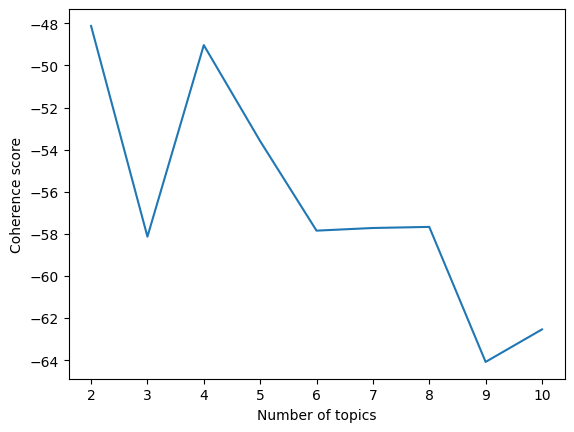

In [35]:
import matplotlib.pyplot as plt

coherences = []
for n in range(2, 11):
    lda = LatentDirichletAllocation(n_components=n,random_state=0)
    lda.fit(X_bow)
    coh = get_average_topic_coherence(X_bow, lda.components_, 10)
    coherences.append(coh)

plt.figure()
plt.plot(range(2, 11), coherences)
plt.xlabel("Number of topics")
plt.ylabel("Coherence score")
plt.xticks(range(2, 11))
plt.show()

Compara con el gráfico que se obtiene al tomar más palabras frecuentes.

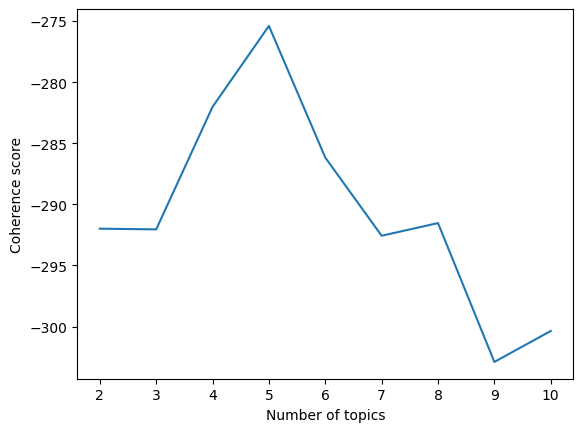

Comparemos ambos etiquetados usando métricas de clustering:

* [Adjusted Mutual Information](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_mutual_info_score.html)
* [Adjusted Rand Index](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_rand_score.html)

In [66]:
from sklearn.metrics import adjusted_mutual_info_score, adjusted_rand_score

print(f"AMI: {adjusted_mutual_info_score(y, topics)}")
print(f"ARI: {adjusted_rand_score(y, topics)}")

AMI: 0.41300212537694175
ARS: 0.42828909233122575


# Topic Modelling: FastText Embeddings y clustering

In [87]:
from gensim.models import FastText

dim = 300

ft_model = FastText(sentences=tokenized_docs, vector_size=dim, window=5, min_count=5, workers=4)

Podemos generar embeddings de palabras `OOV`

In [88]:
ft_model.wv['bola']

array([-2.13430524e-02,  1.59156606e-01, -4.03277464e-02, -1.07230887e-01,
       -2.80683185e-03, -9.46534574e-02, -1.07086137e-01, -6.77858293e-02,
       -4.73013893e-02,  7.93522149e-02, -1.27517745e-01, -5.91839924e-02,
       -1.40836746e-01,  9.05975252e-02,  8.19777921e-02,  7.46912435e-02,
        5.57551496e-02,  1.26657886e-02,  1.07734405e-01,  3.91552038e-02,
       -7.63586834e-02,  1.43280625e-01,  4.92299087e-02, -3.77139486e-02,
       -3.01336613e-03,  4.75272909e-02, -2.44036876e-02, -6.46500438e-02,
       -1.06266662e-01, -2.57855803e-02, -1.29354594e-03, -1.91330295e-02,
       -1.91072561e-02,  2.61257384e-02, -8.28326792e-02,  4.84020971e-02,
        1.26063928e-01, -7.56567568e-02,  9.87427607e-02, -5.47617069e-03,
        1.13101795e-01, -2.50871070e-02,  1.10057674e-01,  2.50695460e-03,
        2.26656143e-02,  3.78654487e-02, -1.38104931e-01,  7.37100840e-02,
       -9.04371738e-02,  3.63185629e-02,  1.66842267e-01,  8.85742381e-02,
        4.40602377e-03,  

In [89]:
doc_vectors = np.zeros((len(docs), ft_model.wv.vector_size))

for i, doc in enumerate(docs):
    words = [w for w in doc.split() if w in ft_model.wv.index_to_key]
    if len(words) > 0:
        these_vectors = np.array([ft_model.wv[w] for w in words])
        doc_vectors[i] = np.mean(these_vectors, axis=0)

In [90]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(doc_vectors)
clustering_labels = kmeans.labels_

In [91]:
from sklearn.manifold import TSNE

tsne_ft = TSNE(n_components=3, metric='cosine')
X_tsne_ft = tsne_ft.fit_transform(doc_vectors)

In [92]:
figure = plot_3d(X_tsne_ft, clustering_labels)
plotly.offline.plot(figure, filename='20ng-ft-mean-kmeans-tsne3d-docs.html')

'20ng-ft-mean-kmeans-tsne3d-docs.html'

## Evaluación

In [93]:
from sklearn.metrics import adjusted_mutual_info_score, adjusted_rand_score

print("Comparación de las etiquetas con clustering en embeddings de word2vec")
print(f"AMI: {adjusted_mutual_info_score(y, clustering_labels)}")
print(f"ARI: {adjusted_rand_score(y, clustering_labels)}")

Comparación de las etiquetas con clustering en embeddings de word2vec
AMI: 0.037782345493074534
ARI: 0.04151435984937233


⭕ ¿Podemos evaluar coherencia?

In [95]:
num_topics = len(np.unique(clustering_labels))
docs_idxs_per_topic = [np.where(clustering_labels == i)[0] for i in range(num_topics)]

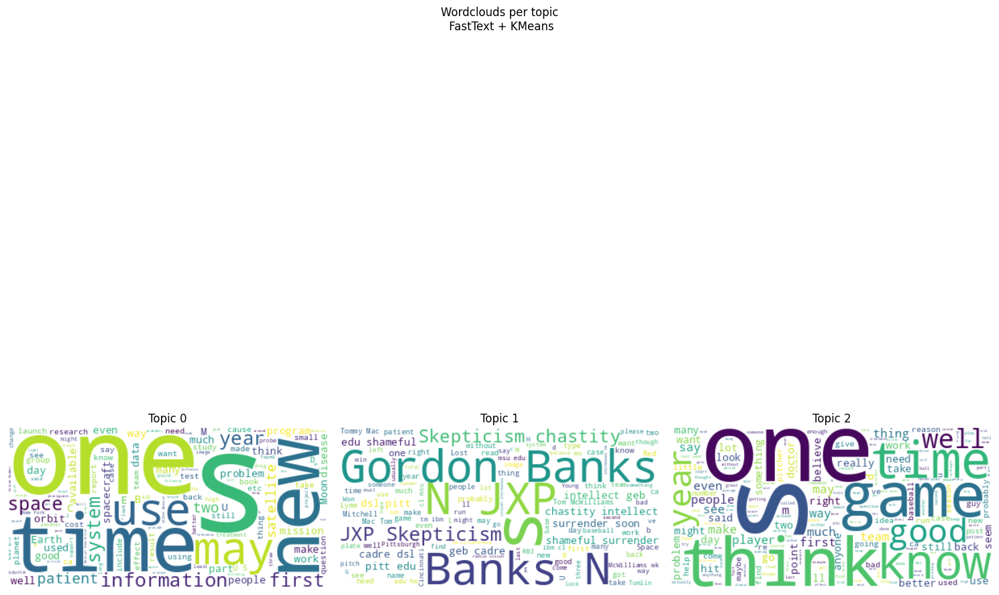

In [96]:
from wordcloud import WordCloud

fig, axs = plt.subplots(1, num_topics, figsize=(15, 15))
fig.suptitle("Wordclouds per topic\n FastText + KMeans")
for ax,j in zip(axs.flatten(),range(num_topics)):
    topic_docs = " ".join([docs[i] for i in docs_idxs_per_topic[j]])
    wc = WordCloud(background_color="white", max_words=2000).generate(topic_docs)
    ax.imshow(wc, interpolation='bilinear')
    ax.set_title(f"Topic {j}")
    ax.axis("off")
fig.tight_layout()
fig.show()

# Topic Modelling: D2V Embeddings y clustering

Usaremos la implementación de gensim.

[Documentación](https://radimrehurek.com/gensim/auto_examples/tutorials/run_doc2vec_lee.html)

In [77]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

tagged_data = [TaggedDocument(doc, [str(i)]) for i, doc in enumerate(tokenized_docs)]

# Parametros
vector_size = 100  # Dimensionality of the feature vectors
window = 5        # Maximum distance between current and predicted word within a sentence
min_count = 1     # Ignores all words with total frequency lower than this
workers = 4       # Use `workers` number of worker threads to train the model
epochs = 40       # Number of iterations (epochs) over the corpus

d2v_model = Doc2Vec(vector_size=vector_size,
                 window=window,
                 min_count=min_count,
                 workers=workers)

d2v_model.build_vocab(tagged_data)

# Entrenamiento
d2v_model.train(tagged_data, total_examples=d2v_model.corpus_count, epochs=epochs)

Consultemos el vector del primer documento

In [78]:
d2v_model.dv[0]

array([ 0.29103404,  0.87404954, -0.89427096,  0.05614889,  0.6853103 ,
       -0.30951366, -0.31069183,  0.1085374 , -0.25483823, -0.50792503,
       -0.74893063, -0.64355123,  0.19492061, -0.6933696 ,  0.9320851 ,
       -0.661426  ,  0.34901354, -0.76092887,  0.4739479 ,  0.19924696,
       -0.10214234, -0.53940207, -0.49856734, -0.0619871 ,  0.12797374,
       -0.00965519, -0.9617171 ,  0.01645111,  0.11901214,  0.22730151,
        0.8766403 , -0.1055982 ,  0.16858853,  0.48332793,  0.19354792,
       -0.16207732, -0.3389002 ,  1.0392001 , -0.20935512,  0.30917653,
        0.91655445, -0.8594403 ,  0.89735436, -0.2792011 ,  0.20035167,
        0.11183315,  0.3395166 , -0.41467878,  0.03188394, -0.23619387,
        0.72018856, -0.97454196,  0.30655074, -0.7475736 , -0.35483608,
        0.26893544, -0.2247566 ,  0.25003022,  0.18898349, -0.175581  ,
       -0.23245817, -0.2552297 ,  0.19165616, -0.17296481, -0.28698823,
        0.20434463,  0.78950036,  0.20332788,  0.10618299, -0.22

Podemos inferir vectores de nuevos documentos

In [80]:
new_doc = "Este es un nuevo documento posterior al entrenamiento."
# new_tagged_doc = TaggedDocument(new_doc.split(), ["new_document"])
vector_for_new_doc = d2v_model.infer_vector(new_doc.split())
print(f"Vector for new document: {vector_for_new_doc}")

Vector for new document: [-0.13091731 -0.07928081  0.01760977 -0.14327128  0.00976973  0.05225586
 -0.11968977  0.08568934  0.05903256 -0.06550274 -0.12919647 -0.21204711
  0.04487703 -0.0914964   0.01760112 -0.06920838  0.05533712 -0.11183549
  0.18761396 -0.0080115   0.06907735 -0.10907758 -0.04994652  0.08011343
  0.08302657  0.04021216  0.08984805  0.02852003  0.13299443  0.12569764
  0.26106378 -0.11295114 -0.03677697  0.15424576  0.04695489  0.08376368
 -0.08358587  0.04816674  0.03138071  0.07628369  0.06803451  0.01600578
 -0.00360018  0.0686833   0.0695239   0.1426353   0.06620782 -0.14509797
 -0.06291692 -0.18850745  0.20864588 -0.17878391  0.01725    -0.03080747
 -0.21705332  0.06536924  0.06166617 -0.03156757  0.134344   -0.1620145
  0.04237219 -0.033799   -0.01835021 -0.02267643 -0.02457667 -0.04029701
  0.21514255 -0.14303036 -0.1367366   0.13477229 -0.15658577 -0.20062324
  0.01214744  0.319117    0.00791253  0.03034362 -0.05828043 -0.07490972
 -0.05781052  0.307934    0

In [82]:
d2v_vectors = d2v_model.dv.vectors
d2v_vectors.shape

(2971, 100)

In [84]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(d2v_vectors)
clustering_d2v_labels = kmeans.labels_

In [85]:
from sklearn.manifold import TSNE

tsne_d2v = TSNE(n_components=3, metric='cosine')
X_tsne_d2v = tsne_d2v.fit_transform(d2v_vectors)

In [86]:
figure_d2v = plot_3d(X_tsne_d2v, clustering_d2v_labels)
plotly.offline.plot(figure_d2v, filename='20ng-d2v-kmeans-tsne3d-docs.html')

'20ng-d2v-kmeans-tsne3d-docs.html'

## Evaluación

In [97]:
from sklearn.metrics import adjusted_mutual_info_score, adjusted_rand_score

print("Comparación de las etiquetas con clustering en embeddings de word2vec")
print(f"AMI: {adjusted_mutual_info_score(y, clustering_d2v_labels)}")
print(f"ARI: {adjusted_rand_score(y, clustering_d2v_labels)}")

Comparación de las etiquetas con clustering en embeddings de word2vec
AMI: 0.157066971667081
ARI: 0.04756033449355362


In [98]:
num_topics = len(np.unique(clustering_d2v_labels))
docs_idxs_per_topic = [np.where(clustering_d2v_labels == i)[0] for i in range(num_topics)]

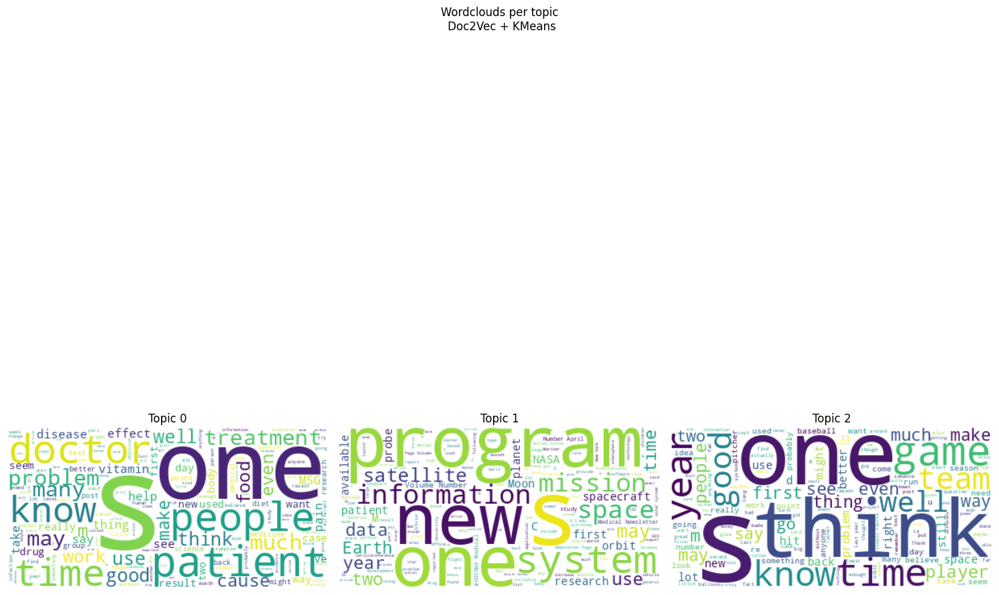

In [99]:
from wordcloud import WordCloud

fig, axs = plt.subplots(1, num_topics, figsize=(15, 15))
fig.suptitle("Wordclouds per topic\n Doc2Vec + KMeans")
for ax,j in zip(axs.flatten(),range(num_topics)):
    topic_docs = " ".join([docs[i] for i in docs_idxs_per_topic[j]])
    wc = WordCloud(background_color="white", max_words=2000).generate(topic_docs)
    ax.imshow(wc, interpolation='bilinear')
    ax.set_title(f"Topic {j}")
    ax.axis("off")
fig.tight_layout()
fig.show()

**Discusión:** ¿Qué metodo parece dar mejores resultados?

⭕ Estrategias pendientes:

1. En el caso de los promedios de embeddings, ¿y si tomamos los vectores normalizados?
2. Usar embeddings de GloVe/FastText/Word2Vec preentrenados.
3. Usar embeddings de las capas intermedias de la red neuronal de la clase pasada.
4. Usar embeddings de mecanismos de atención.